### FYP Title: Machine Learning and Explainable Artificial Intelligence (XAI) in Credit Risk Modelling  
### Developed By: Heng Yi Sheng (TP048930)  
### Supervised By: Dr. Preethi Subramanian  
### 2nd Marker: Assoc. Prof. Dr. Sivakumar Vengusamy

---------

## 5.0 Data Analysis
### Libraries Import

In [1]:
# General libraries
import pandas as pd # Pandas (DataFrame)
import numpy as np # Numpy array
import seaborn as sns # Data visualization
import matplotlib.pyplot as plt # Data visualization
import plotly.express as px # Data visualization

# Data Pre-processing
from sklearn.preprocessing import LabelEncoder # Label Encoders
from sklearn.model_selection import train_test_split # Train Test Split
from sklearn.preprocessing import PowerTransformer # To perform Yeo-Johnson Transformation
from imblearn.over_sampling import SMOTE # Synthetic Minority Oversampling Technique (SMOTE)
from collections import Counter # Counter

# Libraries for model building
from xgboost import XGBClassifier # XGBoost model
import xgboost # XGBoost Feature Importance
from sklearn.tree import DecisionTreeClassifier # Decision Tree model
from sklearn import tree # Visualize Decision Tree
from sklearn.svm import SVC # Support Vector Machine model
from sklearn.linear_model import LogisticRegression # Logistic Regression model
import tensorflow as tf # Artificial Neural Network model (ANN)
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier # Keras wrapper for ANN
from sklearn.ensemble import VotingClassifier # Voting Ensemble

# Libraries for model optimization
from sklearn.model_selection import GridSearchCV # To perform hyperparameters tuning 

# Libraries for model evaluation
from sklearn.metrics import accuracy_score # Obtaining accuracy score of the model
from sklearn.model_selection import cross_val_score # To perform k-fold cross validation
from sklearn.metrics import ConfusionMatrixDisplay # Confusion matrix
from sklearn.metrics import classification_report # For classification report
from sklearn.metrics import roc_curve, roc_auc_score # ROC Curve and AUC Measures

# Library for serializing and de-serializing Python object structures
import pickle # For serializing and de-serializing the object structure in Python

-------

### Initial Data Exploration

In [2]:
# Loading credit risk data into JupyterLab
data = pd.read_csv("D:\Essien\Degree Studies\Degree Level 3\Semester 2\FYP\credit_risk_dataset.csv")
data.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [28]:
# Shape of the data
print(data.shape)

(32581, 12)


In [7]:
# Prints information about a DataFrame including the index dtype and columns, non-null values and memory usage
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [4]:
# Descriptive Statistics
data[['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length']].describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000


In [5]:
# Skewness of the data
print(data.skew())

person_age                     2.581393
person_income                 32.865349
person_emp_length              2.614455
loan_amnt                      1.192477
loan_int_rate                  0.208550
loan_status                    1.364888
loan_percent_income            1.064669
cb_person_cred_hist_length     1.661790
dtype: float64


In [4]:
# Identify missing values
print(data.isnull().sum())

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64


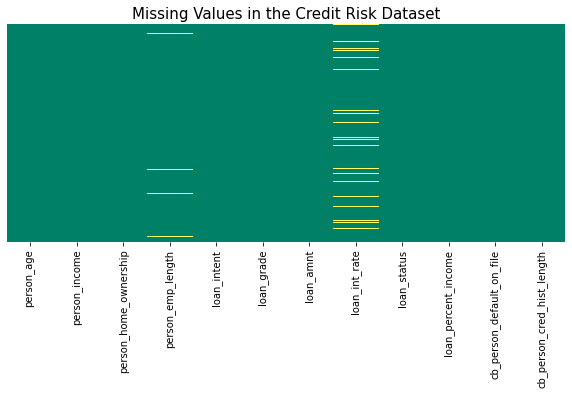

In [8]:
# Visualize missing values in the dataset
plt.figure(figsize = (10, 4))
sns.heatmap(data.isnull(), yticklabels = False, cbar = False, cmap = 'summer')
plt.title('Missing Values in the Credit Risk Dataset', size = 15)
plt.show()

-------

### Pre-cleaning Data Analysis

In [29]:
# Number of instances in each class (1 = Default, 0 = Non-Default)
data.groupby('loan_status').size()

loan_status
0    25473
1     7108
dtype: int64

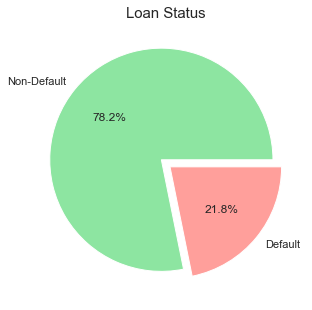

In [13]:
# Pie chart of loan status
plt.figure(figsize = (5, 8))
labels = ['Non-Default', 'Default']
count_of_loan_status = data['loan_status'].value_counts()
colors = sns.color_palette('pastel')[2:4]
plt.pie(x = count_of_loan_status, labels = labels, autopct = '%.1f%%', explode = [0.05]*2, colors = colors) # Create pie chart
plt.title('Loan Status', fontsize = 15)
plt.show()

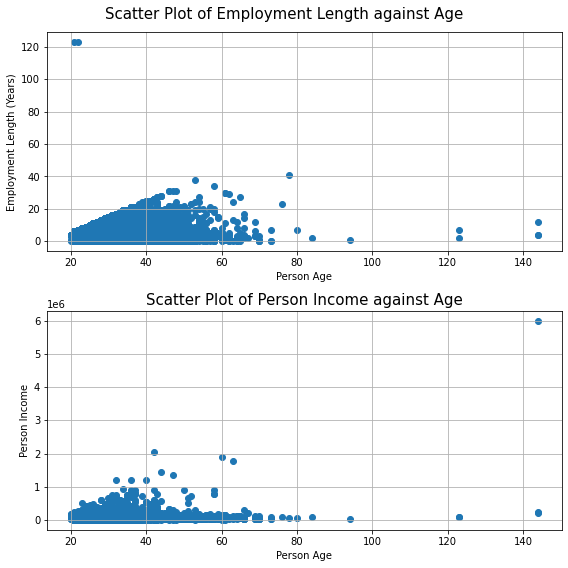

In [3]:
fig, ax = plt.subplots(2, figsize = (8, 8))
# Scatter plot of employment length (years) against age
ax[0].scatter(x = data['person_age'], y = data['person_emp_length'])
ax[0].set_xlabel('Person Age')
ax[0].set_ylabel('Employment Length (Years)')
ax[0].grid()

# Scatter plot of Person Income against age
ax[1].scatter(x = data['person_age'], y = data['person_income'])
ax[1].set_xlabel('Person Age')
ax[1].set_ylabel('Person Income')
ax[1].grid()

fig.suptitle("Scatter Plot of Employment Length against Age", size = 15)
plt.title("Scatter Plot of Person Income against Age", size = 15)
plt.tight_layout()
plt.show()

It is noticeable that there are some issues within the data by looking at the scatter plot. It is unreal that humans live more than 120 years. Moreover, it is also impossible for two 20 years old individuals to be having more than 120 years of experience. Thus, cleaning will be performed to replace these outliers to a more reasonable value. 

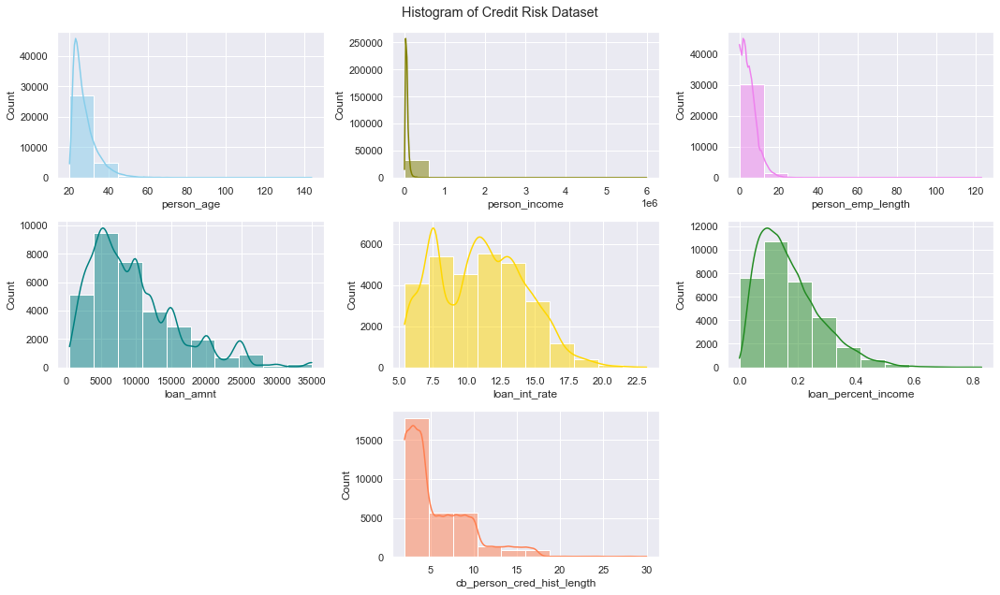

In [11]:
fig, axs = plt.subplots(3, 3, figsize=(15, 9))

# Plot histogram based on Continuous data columns
fig.suptitle('Histogram of Credit Risk Dataset')
sns.histplot(data = data, x = "person_age", kde = True, color = "skyblue", bins = 10, ax = axs[0, 0])
sns.histplot(data = data, x = "person_income", kde = True, color = "olive", bins = 10, ax = axs[0, 1])
sns.histplot(data = data, x = "person_emp_length", kde = True, color = "violet", bins = 10, ax = axs[0, 2])
sns.histplot(data = data, x = "loan_amnt", kde = True, color = "teal", bins = 10, ax = axs[1, 0])
sns.histplot(data = data, x = "loan_int_rate", kde = True, color = "gold", bins = 10, ax = axs[1, 1])
sns.histplot(data = data, x = "loan_percent_income", kde = True, color = "forestgreen", bins = 10, ax = axs[1, 2])
sns.histplot(data = data, x = "cb_person_cred_hist_length", kde = True, color = "coral", bins = 10, ax = axs[2, 1])

# Delete unused subplots
fig.delaxes(axs[2, 0])
fig.delaxes(axs[2, 2])

fig.tight_layout()
plt.show()

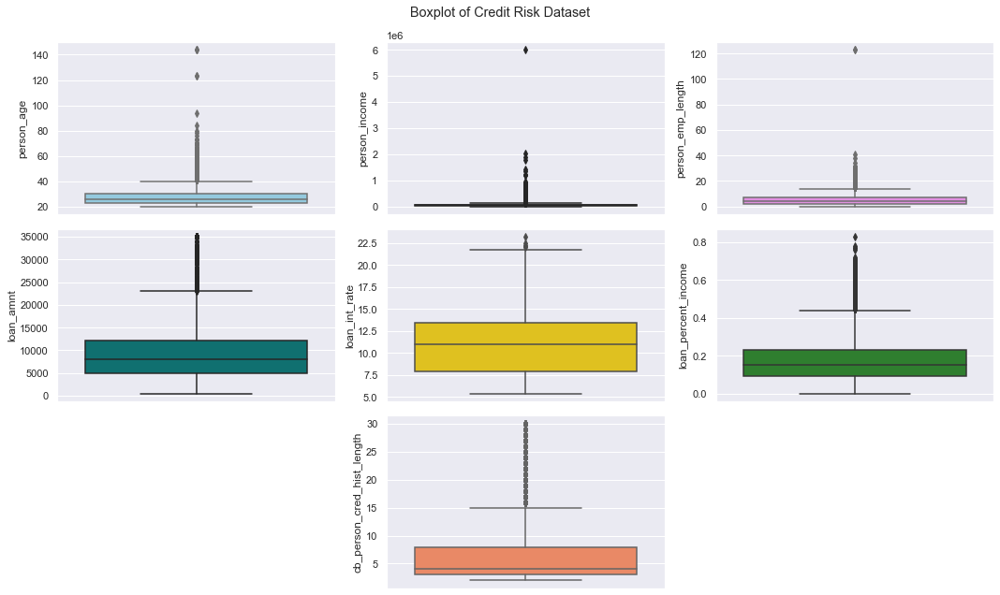

In [12]:
fig, axs = plt.subplots(3, 3, figsize=(15, 9))

# Plot Boxplot based on Continuous data columns
fig.suptitle('Boxplot of Credit Risk Dataset')
sns.boxplot(data = data, y = "person_age", color = "skyblue", ax = axs[0, 0])
sns.boxplot(data = data, y = "person_income", color = "olive", ax = axs[0, 1])
sns.boxplot(data = data, y = "person_emp_length", color = "violet",ax = axs[0, 2])
sns.boxplot(data = data, y = "loan_amnt", color = "teal", ax = axs[1, 0])
sns.boxplot(data = data, y = "loan_int_rate", color = "gold", ax = axs[1, 1])
sns.boxplot(data = data, y = "loan_percent_income", color = "forestgreen", ax = axs[1, 2])
sns.boxplot(data = data, y = "cb_person_cred_hist_length", color = "coral", ax = axs[2, 1])

# Delete unused subplots
fig.delaxes(axs[2, 0])
fig.delaxes(axs[2, 2])

fig.tight_layout()
plt.show()

-------

### Data Visualization

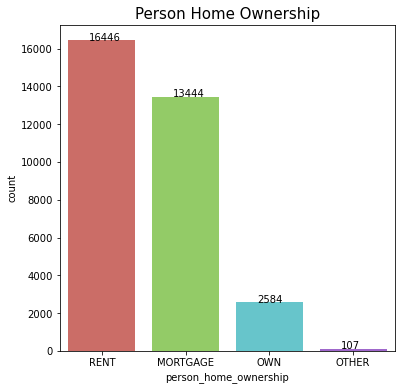

In [4]:
# Bar chart of person home ownership
plt.figure(figsize = (6, 6))
ax = sns.countplot(x = data['person_home_ownership'], palette = 'hls', order = data['person_home_ownership'].value_counts().index) # Create bar chart (countplot)
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) # Formatting the bar chart by including count value at the top of the bar charts
plt.title('Person Home Ownership', size = 15)
plt.show()

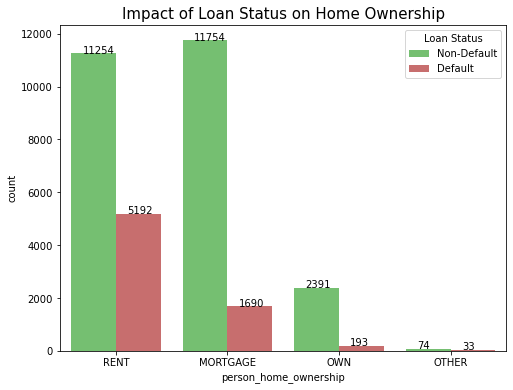

In [3]:
# Bar chart of home ownership by Loan Status
plt.figure(figsize = (8, 6))
colors = sns.color_palette('muted')[2:4] # Color palette
ax = sns.countplot(x = data['person_home_ownership'], hue = data['loan_status'], palette = colors, order = data['person_home_ownership'].value_counts().index) # Create bar chart (countplot)
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+0.15)) # Formatting the bar chart by including count value at the top of the bar charts
legend_labels, _= ax.get_legend_handles_labels()
ax.legend(legend_labels, ['Non-Default', 'Default'], bbox_to_anchor = (1,1), title = 'Loan Status') # Rename Legend
plt.title('Impact of Loan Status on Home Ownership', size = 15)
plt.show()

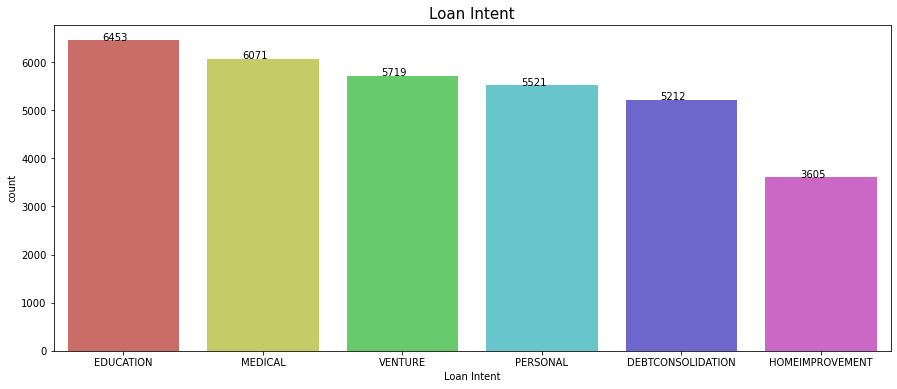

In [6]:
# Bar chart of loan intent
plt.figure(figsize = (15, 6))
ax = sns.countplot(x = data['loan_intent'], palette = 'hls', order = data['loan_intent'].value_counts().index) # Create bar chart (countplot)
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) # Formatting the bar chart by including count value at the top of the bar charts
plt.xlabel('Loan Intent')
plt.title('Loan Intent', size = 15)
plt.show()

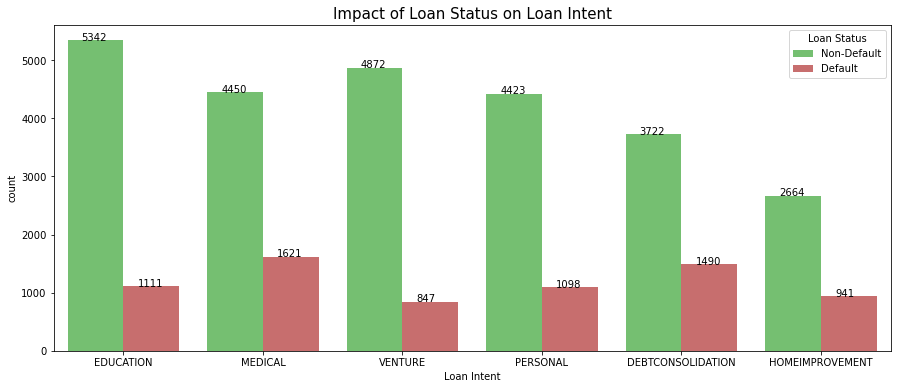

In [107]:
# Bar chart of loan Intent by Loan Status
plt.figure(figsize = (15, 6))
colors = sns.color_palette('muted')[2:4] # Color palette
ax = sns.countplot(x = data['loan_intent'], hue = data['loan_status'], palette = colors, order = data['loan_intent'].value_counts().index) # Create bar chart (countplot)
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+0.15)) # Formatting the bar chart by including count value at the top of the bar charts
legend_labels, _= ax.get_legend_handles_labels()
ax.legend(legend_labels, ['Non-Default', 'Default'], bbox_to_anchor = (1,1), title = 'Loan Status') # Rename Legend
plt.xlabel('Loan Intent')
plt.title('Impact of Loan Status on Loan Intent', size = 15)
plt.show()

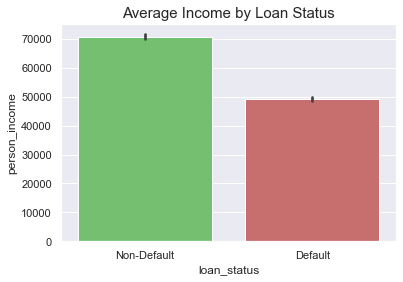

In [16]:
# Barplot of average income by loan status (Visualize average income based on loan status)
colors = sns.color_palette('muted')[2:4]
ax = sns.barplot(x = 'loan_status', y = 'person_income', data = data, palette = colors)
ax.set_xticklabels(['Non-Default', 'Default'])
plt.title('Average Income by Loan Status', size = 15)
plt.show()

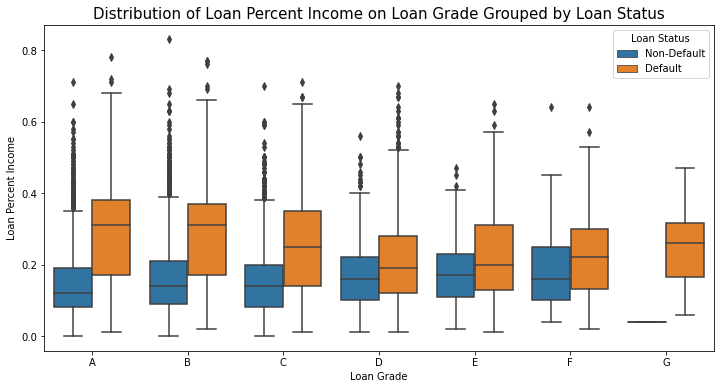

In [106]:
# Box Plot of Loan Grade based on Loan Status
plt.figure(figsize = (12, 6))
order = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
ax = sns.boxplot(x = data['loan_grade'], y = data['loan_percent_income'], hue = data['loan_status'], order = order)
plt.xlabel('Loan Grade')
plt.ylabel('Loan Percent Income')
plt.title('Distribution of Loan Percent Income on Loan Grade Grouped by Loan Status', size = 15)
legend_labels, _= ax.get_legend_handles_labels()
ax.legend(legend_labels, ['Non-Default', 'Default'], bbox_to_anchor = (1,1), title = 'Loan Status') # Rename Legend
plt.show()

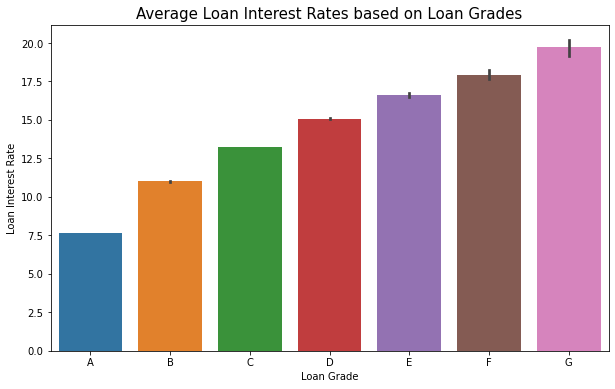

In [20]:
plt.figure(figsize = (10, 6))
order = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
sns.barplot(x = data['loan_grade'], y = data['loan_int_rate'], order = order)
plt.xlabel('Loan Grade')
plt.ylabel('Loan Interest Rate')
plt.title('Average Loan Interest Rates based on Loan Grades', size = 15)
plt.show()

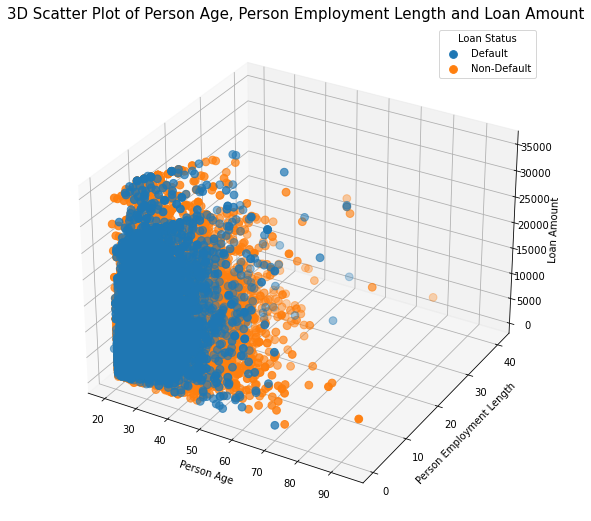

In [14]:
# Parallel Coordinate Plot
fig = plt.figure(figsize = (16, 9))
ax = fig.add_subplot(111, projection = '3d')
ax.set_xlabel('Person Age')
ax.set_ylabel('Person Employment Length')
ax.set_zlabel('Loan Amount')
for l in data.loan_status.unique():
    ax.scatter(data.person_age[data.loan_status == l], data.person_emp_length[data.loan_status == l], data.loan_amnt[data.loan_status == l], label = l, s = 60)

plt.title('3D Scatter Plot of Person Age, Person Employment Length and Loan Amount', size = 15)    
legend_labels, _= ax.get_legend_handles_labels()
ax.legend(legend_labels, ['Default', 'Non-Default'], bbox_to_anchor = (1,1), title = 'Loan Status')
plt.show()

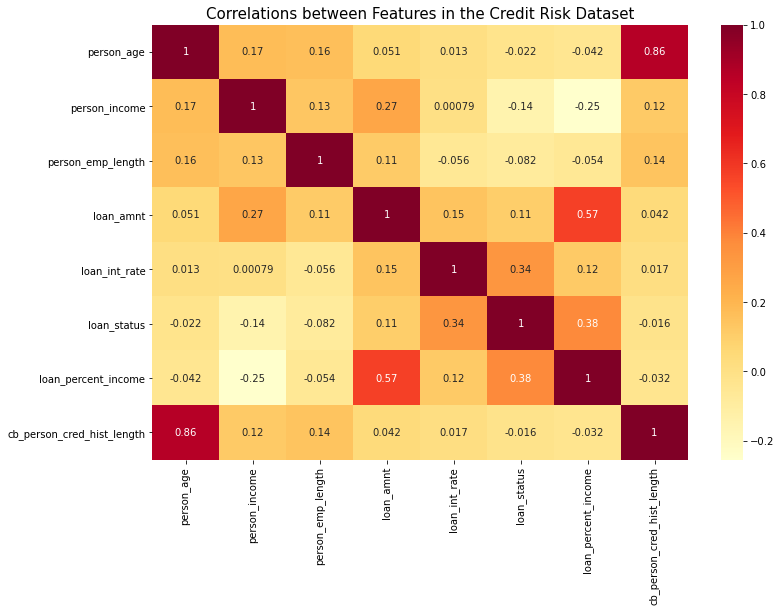

In [186]:
# Correlation matrix between features in Credit Risk Dataset
plt.figure(figsize = (12, 8))
corrMatrix = data.corr()
sns.heatmap(corrMatrix, annot = True, cmap = "YlOrRd")
plt.title("Correlations between Features in the Credit Risk Dataset", size = 15)
plt.show()

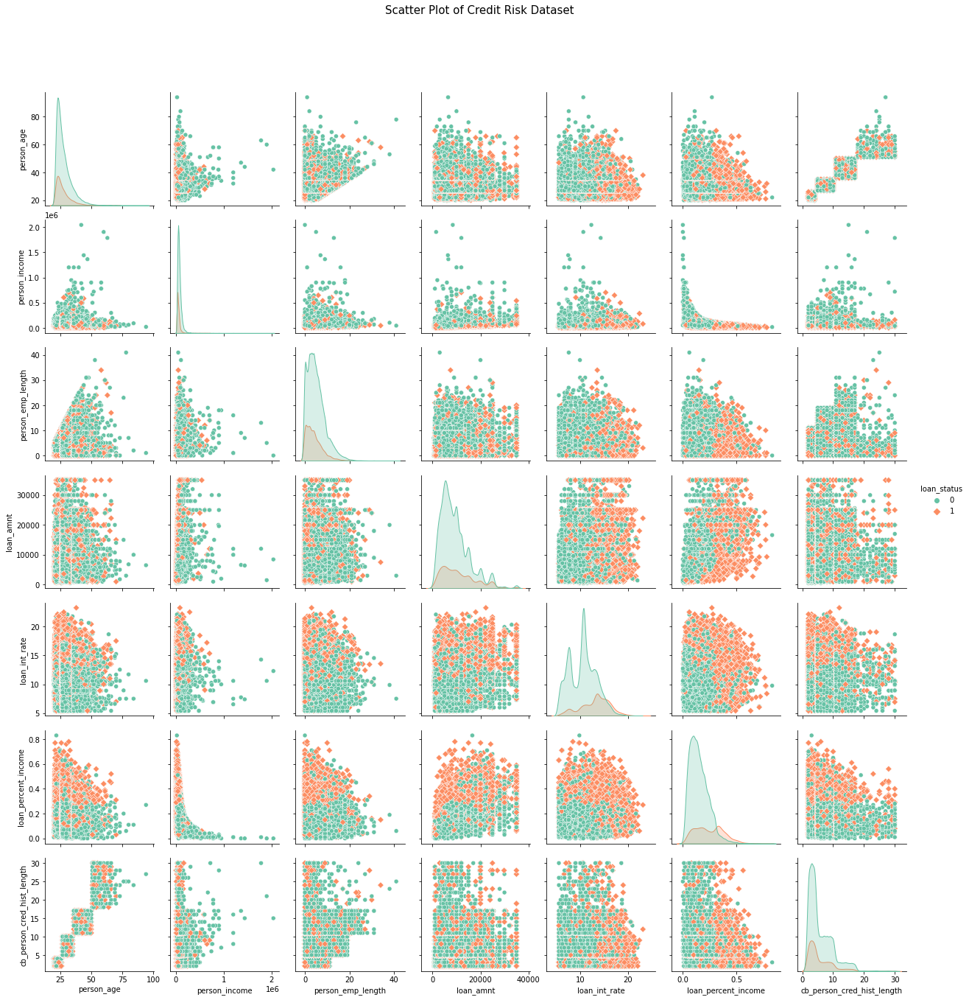

In [10]:
# Scatter Plot Matrix of all Continuous Variables
sp = sns.pairplot(data, kind = 'scatter', hue = 'loan_status', markers = ['o', 'D'], palette = 'Set2')
sp.fig.suptitle('Scatter Plot of Credit Risk Dataset', size = 15, y = 1.08)
plt.show()

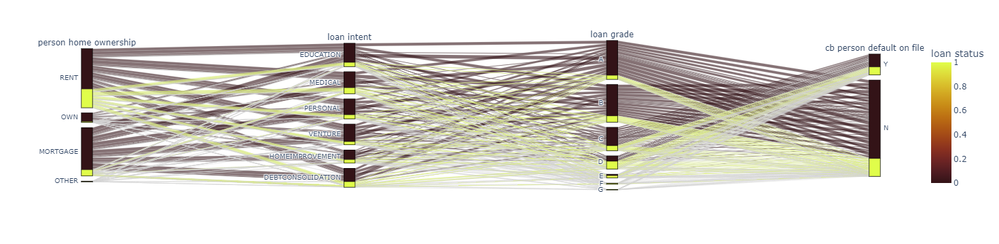

In [4]:
# Parallel Category Diagram of Categorical Variables
fig = px.parallel_categories(data, color_continuous_scale = px.colors.sequential.solar, color = 'loan_status',
                            dimensions = ['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file'],
                                         labels = {col:col.replace('_', ' ') for col in data.columns})
fig.show()

-------

### Data Cleaning
### Missing Values and Extreme Values
#### Replace Missing Values and Outliers (person_emp_length)

In [4]:
# Compute median value of person_emp_length based on person_age
median_person_emp_length = data.groupby('person_age')['person_emp_length'].agg('median').astype('float')
np.asarray(median_person_emp_length)

# Function to replace missing values and outliers of person_emp_length column
def replace_person_emp_length(x):
    temp = median_person_emp_length[x['person_age']]
    return temp
    
# Replace missing values and outliers (employment length greater than 100) of person_emp_length    
data['person_emp_length'] = data.apply(lambda x: replace_person_emp_length(x) if (pd.isna(x['person_emp_length'])) or (x['person_emp_length'] > 100) else x['person_emp_length'], axis = 1)

#### Replace Missing Values (loan_int_rate)

In [5]:
# Compute median value of loan_int_rate based on loan_status
median_loan_int_rate = data.groupby('loan_status')['loan_int_rate'].agg('median').astype('float')
np.asarray(median_loan_int_rate)

# Function to replace missing values of loan_int_rate column
def replace_loan_int_rate(x):
    temp = median_loan_int_rate[x['loan_status']]
    return temp
    
# Replace missing values of loan_int_rate    
data['loan_int_rate'] = data.apply(lambda x: replace_loan_int_rate(x) if pd.isna(x['loan_int_rate']) else x['loan_int_rate'], axis = 1)

#### Replace Outliers (person_age)

In [6]:
# Compute median value of person_age based on cb_person_cred_hist_length
median_person_age = data.groupby('cb_person_cred_hist_length')['person_age'].agg('median').astype('float')
np.asarray(median_person_age)

# Function to replace outliers of person_age column
def replace_person_age(x):
    temp = median_person_age[x['cb_person_cred_hist_length']]
    return temp
    
# Replace outliers of person_age (Individuals age greater than 100)    
data['person_age'] = data.apply(lambda x: replace_person_age(x) if (x['person_age'] > 100) else x['person_age'], axis = 1)

#### Replace Outliers (person_income)

In [7]:
# Replace outliers of person_income (Individuals having income greater than 4,000,000)
data['person_income'] = data.apply(lambda x: data['person_income'].median() if (x['person_income'] > 4000000) else x['person_income'], axis = 1)  

#### Make a copy of data for Web Application Exploration Page

In [8]:
# Copy the DataFrame 
data_WA = data.copy()
# Save the DataFrame as xlsx file (Excel file)
data_WA.to_excel('D:\Essien\Degree Studies\Degree Level 3\Semester 2\FYP\WebApp\data_WA.xlsx', index = False)

#### One Hot Encoding

In [9]:
# One Hot Encoding
data = pd.get_dummies(data, columns = ['person_home_ownership', 'loan_intent', 'loan_grade'])

#### Label Encoding

In [10]:
# Label Encoding for cb_person_cred_hist_length
label_encoder = LabelEncoder()
data['cb_person_default_on_file'] = label_encoder.fit_transform(data['cb_person_default_on_file'])

#### Feature Selection

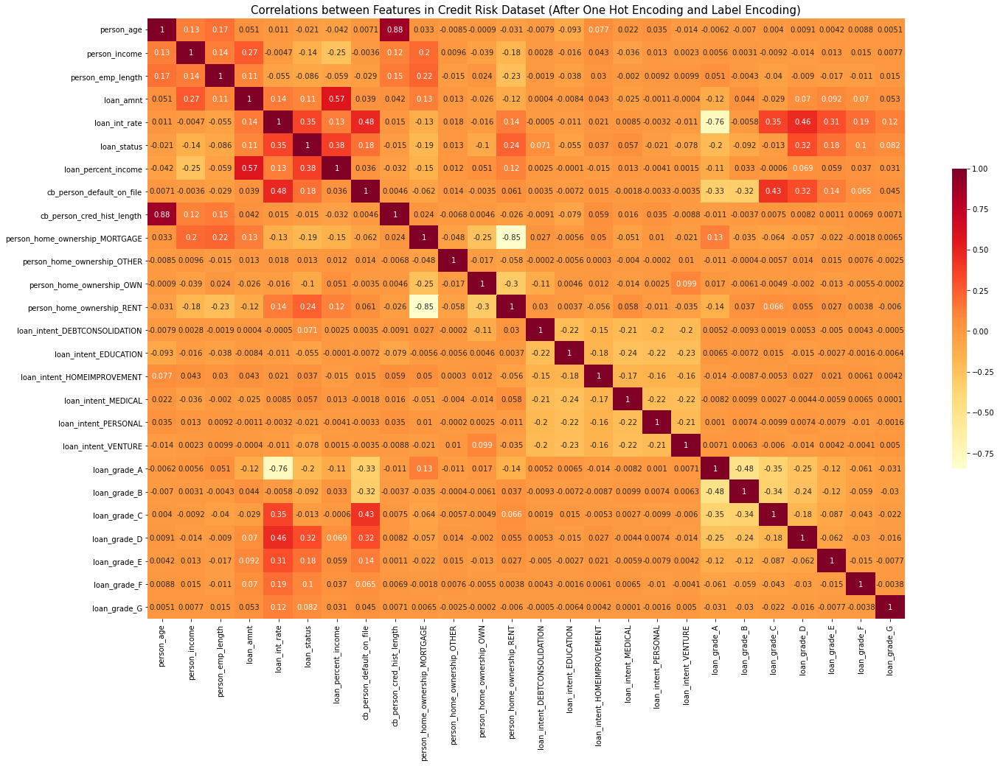

In [26]:
# Correlation Matrix (Heatmap) before Feature Selection
plt.figure(figsize = (23, 15))
corrMatrix = data.corr().round(4)
sns.heatmap(corrMatrix, annot = True, cmap = "YlOrRd", cbar_kws = {"shrink": 0.5})
plt.title("Correlations between Features in Credit Risk Dataset (After One Hot Encoding and Label Encoding)", size = 15)
plt.show()

In [11]:
# Drop Columns
data = data.drop(columns = ['person_age'], axis = 1)
data = data.drop(columns = ['loan_percent_income'], axis = 1)
data = data.drop(columns = ['person_home_ownership_RENT'], axis = 1)
data = data.drop(columns = ['loan_grade_A'], axis = 1)

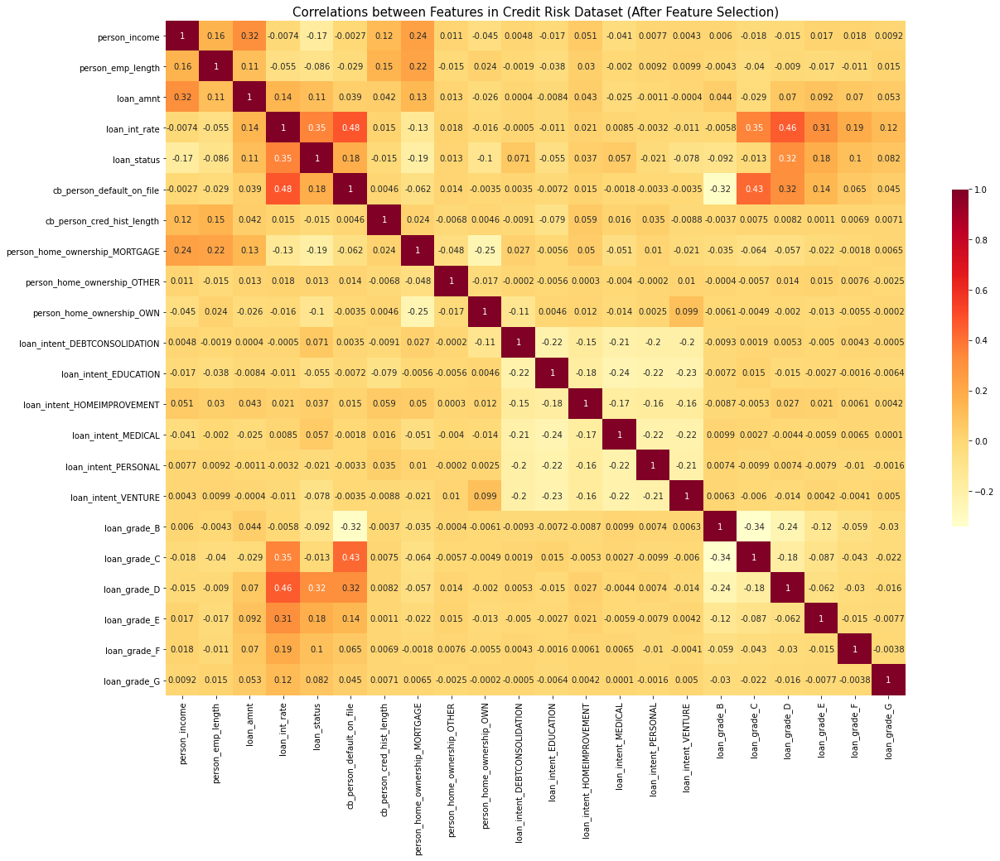

In [10]:
# Correlation Matrix (Heatmap) after Feature Selection - Removed Features to avoid multicollinearity issue
plt.figure(figsize = (20, 15))
corrMatrix = data.corr().round(4)
sns.heatmap(corrMatrix, annot = True, cmap = "YlOrRd", cbar_kws = {"shrink": 0.5})
plt.title("Correlations between Features in Credit Risk Dataset (After Feature Selection)", size = 15)
plt.show()
#plt.savefig("Test.png")

#### Splitting the dataset into Training Set and Test Set 

In [12]:
# Separate data into independent variable (x_data) and dependent variable (y_data)
x_data = pd.concat([data.iloc[:, 0:4], data.iloc[:, 5:]], axis = 1)
y_data = data.iloc[:, 4:5]

In [13]:
# Split into Training Set (70%) and Testing Set (30%)
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size = 0.3, random_state = 1)
print("The training dataset has {} data \nThe testing dataset has {} data".format(len(x_train), len(x_test)))

The training dataset has 22806 data 
The testing dataset has 9775 data


#### Transform Continuous Variables to Closely Resembles a Normal Distribution
#### Yeo-Johnson Transformation with Standardization

In [14]:
# Yeo-Johnson Transformation - can deal with both positive values, negative values and zeros (extension of box-cox transformation)
x_train = x_train[x_train.notnull()].copy() # To create a copy
x_test = x_test[x_test.notnull()].copy() # To create a copy

pt_yeo_johnson = PowerTransformer(method = 'yeo-johnson', standardize = True)
x_train[['person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'cb_person_cred_hist_length']] = pt_yeo_johnson.fit_transform(x_train[['person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'cb_person_cred_hist_length']])
x_test[['person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'cb_person_cred_hist_length']] = pt_yeo_johnson.transform(x_test[['person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'cb_person_cred_hist_length']])

### Validate the Credit Risk Data after Data Pre-processing and Feature Selection 

#### Data Shape and Info

In [13]:
# Rows and Columns in the dataset after data pre-processing
data.shape

(32581, 22)

In [14]:
# Existing Columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_income                   32581 non-null  float64
 1   person_emp_length               32581 non-null  float64
 2   loan_amnt                       32581 non-null  int64  
 3   loan_int_rate                   32581 non-null  float64
 4   loan_status                     32581 non-null  int64  
 5   cb_person_default_on_file       32581 non-null  int32  
 6   cb_person_cred_hist_length      32581 non-null  int64  
 7   person_home_ownership_MORTGAGE  32581 non-null  uint8  
 8   person_home_ownership_OTHER     32581 non-null  uint8  
 9   person_home_ownership_OWN       32581 non-null  uint8  
 10  loan_intent_DEBTCONSOLIDATION   32581 non-null  uint8  
 11  loan_intent_EDUCATION           32581 non-null  uint8  
 12  loan_intent_HOMEIMPROVEMENT     

In [15]:
# To combine x_train and x_test for validating the results of data pre-processing
data_val = x_train.append(x_test, ignore_index = True)

##### Histogram Distribution after Cleaning and Transformation

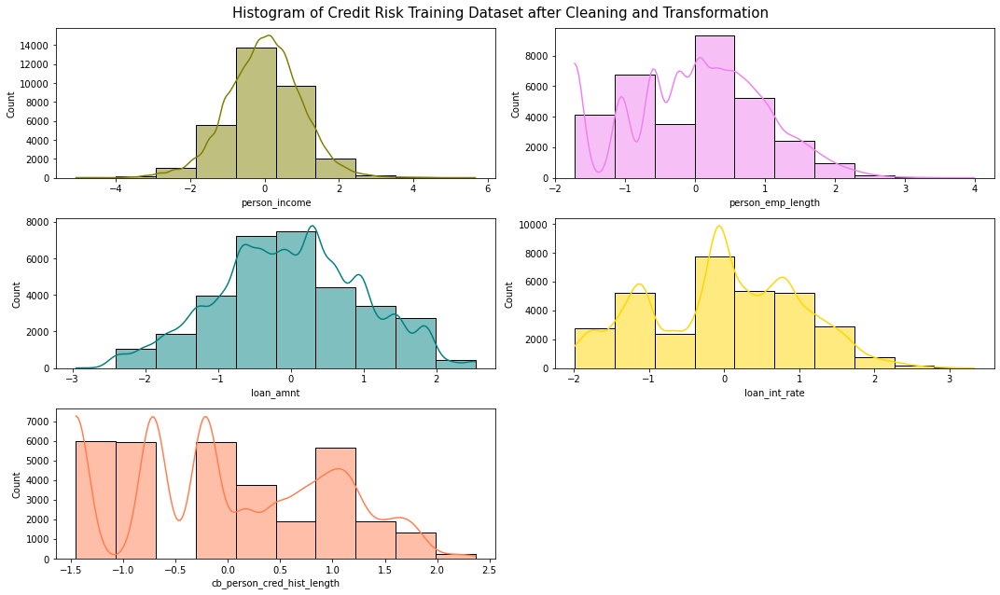

In [15]:
fig, axs = plt.subplots(3, 2, figsize=(15, 9))

# Plot histogram based on selected data columns
fig.suptitle('Histogram of Credit Risk Training Dataset after Cleaning and Transformation', size = 15)
sns.histplot(data = data_val, x = "person_income", kde = True, color = "olive", bins = 10, ax = axs[0, 0])
sns.histplot(data = data_val, x = "person_emp_length", kde = True, color = "violet", bins = 10, ax = axs[0, 1])
sns.histplot(data = data_val, x = "loan_amnt", kde = True, color = "teal", bins = 10, ax = axs[1, 0])
sns.histplot(data = data_val, x = "loan_int_rate", kde = True, color = "gold", bins = 10, ax = axs[1, 1])
sns.histplot(data = data_val, x = "cb_person_cred_hist_length", kde = True, color = "coral", bins = 10, ax = axs[2, 0])

# Delete unused subplots
fig.delaxes(axs[2, 1])

fig.tight_layout()
plt.show()

##### Boxplot Distribution after Cleaning and Transformation

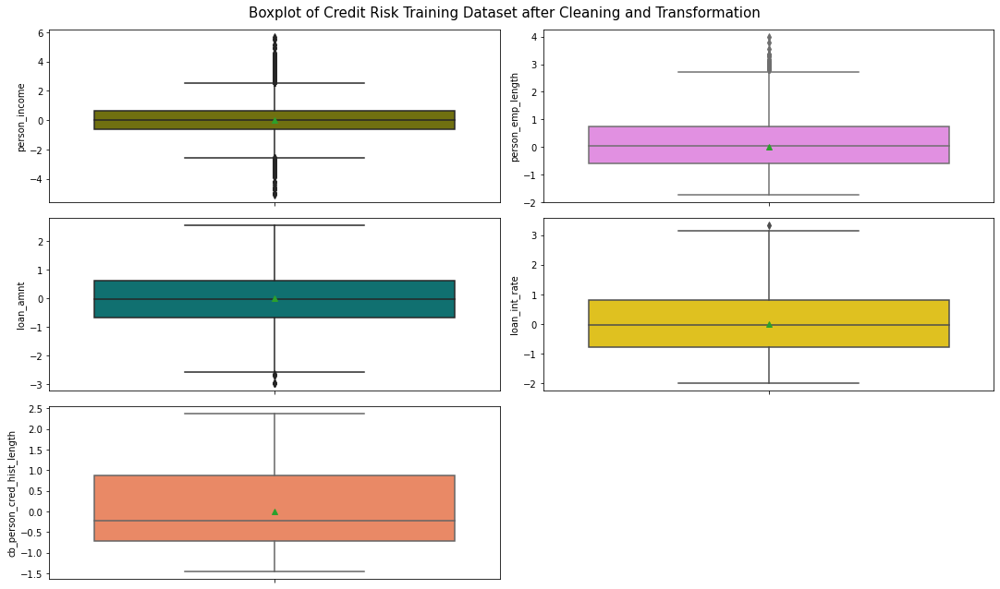

In [16]:
fig, axs = plt.subplots(3, 2, figsize=(15, 9))

# Plot Boxplot based on selected data columns
fig.suptitle('Boxplot of Credit Risk Training Dataset after Cleaning and Transformation', size = 15)
sns.boxplot(data = data_val, y = "person_income", showmeans = True, color = "olive", ax = axs[0, 0])
sns.boxplot(data = data_val, y = "person_emp_length", showmeans = True, color = "violet",ax = axs[0, 1])
sns.boxplot(data = data_val, y = "loan_amnt", showmeans = True, color = "teal", ax = axs[1, 0])
sns.boxplot(data = data_val, y = "loan_int_rate", showmeans = True, color = "gold", ax = axs[1, 1])
sns.boxplot(data = data_val, y = "cb_person_cred_hist_length", showmeans = True, color = "coral", ax = axs[2, 0])

# Delete unused subplots
fig.delaxes(axs[2, 1])

fig.tight_layout()
plt.show()

##### Skewness of the data after Cleaning and Transformation

In [13]:
# Skewness of the data after Cleaning and Transformation
print(data_val[['person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'cb_person_cred_hist_length']].skew())

person_income                -0.013038
person_emp_length            -0.044021
loan_amnt                    -0.020580
loan_int_rate                -0.033302
cb_person_cred_hist_length    0.092021
dtype: float64


-------

### Data Modelling and Optimization
#### Oversampling
#### SMOTE (Synthetic Minority Oversampling Technique)

The overall credit risk dataset has 7108 default loans out of 32,581 loans. This is highly unbalanced whereby the positive class (default) account for 21.82% of all loans.   

In [15]:
print("Before SMOTE, oversampling technique:", Counter(np.ravel(y_train)))

# Using SMOTE module from imblearn library to perform oversampling with the intention of overcoming class imbalance
smote = SMOTE(random_state = 1)
x_train_smote, y_train_smote = smote.fit_resample(x_train, y_train) # fit training dataset into SMOTE module 

print('\nAfter OverSampling, the shape of x_train: {}'.format(x_train_smote.shape))
print('After OverSampling, the shape of y_train: {} \n'.format(y_train_smote.shape))
  
print("After SMOTE, oversampling technique:", Counter(np.ravel(y_train_smote)))

Before SMOTE, oversampling technique: Counter({0: 17847, 1: 4959})

After OverSampling, the shape of x_train: (35694, 21)
After OverSampling, the shape of y_train: (35694, 1) 

After SMOTE, oversampling technique: Counter({0: 17847, 1: 17847})


#### Model Building and Hyperparameters Tuning
#### 1. XGBoost

In [27]:
xgboost_model = XGBClassifier(use_label_encoder = False, eval_metric='logloss')
xgboost_model.fit(x_train_smote, np.ravel(y_train_smote))

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)

In [21]:
# Cross Validation
score = cross_val_score(xgboost_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = xgboost_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = xgboost_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

94.81% accuracy with a standard deviation of 0.05
Training Accuracy: 96.94%, Testing Accuracy: 93.04%


In [46]:
# Hyperparameters of XGBoost
parameters = [{'gamma': [0.1, 1, 1.5], 'learning_rate': [0.05, 0.01, 0.1], 'max_depth': [3, 6, 9], 'reg_lambda': [0.5, 1, 2]}]

# GridSearch CV of XGBoost model
grid_search = GridSearchCV(estimator = xgboost_model, param_grid = parameters, scoring = 'accuracy', n_jobs = -1)

best_model = grid_search.fit(x_train_smote, y_train_smote)
print('Optimum parameters', best_model.best_params_)

Optimum parameters {'gamma': 1, 'learning_rate': 0.1, 'max_depth': 9, 'reg_lambda': 1}


~0, train: 0.500, test: 0.220
~10, train: 0.104, test: 0.090
~20, train: 0.092, test: 0.087
~30, train: 0.078, test: 0.082
~40, train: 0.066, test: 0.080
~50, train: 0.050, test: 0.077
~60, train: 0.042, test: 0.074
~70, train: 0.038, test: 0.072
~80, train: 0.036, test: 0.071
~90, train: 0.033, test: 0.071


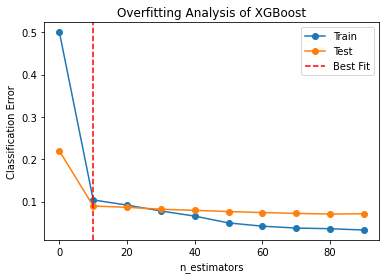

In [28]:
train_scores, test_scores = list(), list()
# define the tree depths to evaluate
values = [i for i in range(0, 100, 10)]
# evaluate a XGBoost model for each estimator
for i in values:
    # configure the model
    model = XGBClassifier(gamma = 1, learning_rate = 0.1, max_depth = 9, reg_lambda = 1, n_estimators = i, use_label_encoder = False, eval_metric='logloss')
    # fit model on the training dataset
    model.fit(x_train_smote, y_train_smote)
    # evaluate on the train dataset
    train_yhat = model.predict(x_train_smote)
    train_acc = 1 - accuracy_score(y_train_smote, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = 1 - accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('~%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
# plot of train and test scores vs n_estimators
plt.plot(values, train_scores, '-o', label='Train')
plt.plot(values, test_scores, '-o', label='Test')
plt.axvline(10, color = 'red', linestyle = '--', label = 'Best Fit')
plt.xlabel("n_estimators")
plt.ylabel("Classification Error")
plt.title("Overfitting Analysis of XGBoost")
plt.legend()
plt.show()

In [16]:
tuned_xgboost_model = XGBClassifier(gamma = 1, 
                                    learning_rate = 0.1, 
                                    max_depth = 9, 
                                    reg_lambda = 1, 
                                    n_estimators = 10, 
                                    use_label_encoder = False, 
                                    eval_metric='logloss')
tuned_xgboost_model.fit(x_train_smote, np.ravel(y_train_smote))

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=1, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=9, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=10, n_jobs=12,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)

In [15]:
# Accuracy of tuned XGBoost model
score = cross_val_score(tuned_xgboost_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = tuned_xgboost_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = tuned_xgboost_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

87.86% accuracy with a standard deviation of 0.01
Training Accuracy: 89.59%, Testing Accuracy: 91.03%


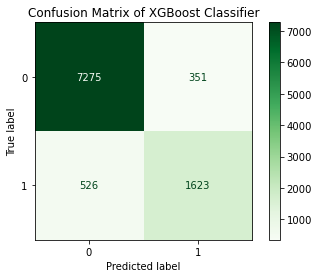

In [20]:
disp = ConfusionMatrixDisplay.from_estimator(tuned_xgboost_model, 
                                             x_test, 
                                             y_test, 
                                             cmap = plt.cm.Greens)
disp.ax_.set_title('Confusion Matrix of XGBoost Classifier')
plt.show()

In [19]:
print(classification_report(y_test, test_ypred))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      7626
           1       0.82      0.76      0.79      2149

    accuracy                           0.91      9775
   macro avg       0.88      0.85      0.87      9775
weighted avg       0.91      0.91      0.91      9775



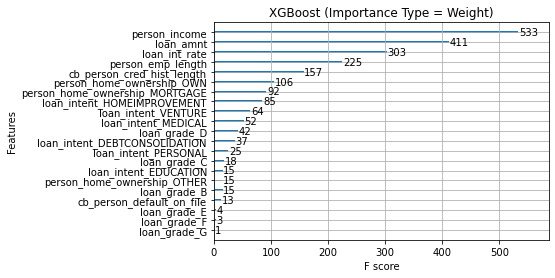

In [17]:
# XGBoost Feature Importance (Weight)
xgboost.plot_importance(tuned_xgboost_model, importance_type = 'weight')
plt.title('XGBoost (Importance Type = Weight)')
plt.show()

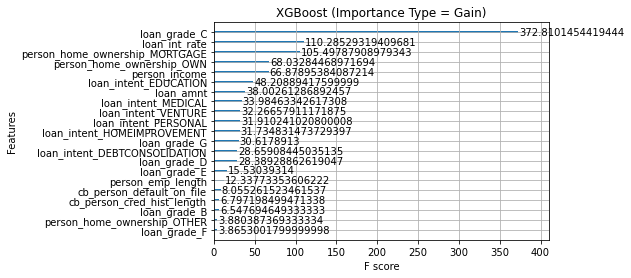

In [19]:
# XGBoost Feature Importance (Gain)
xgboost.plot_importance(tuned_xgboost_model, importance_type = 'gain')
plt.title('XGBoost (Importance Type = Gain)')
plt.show()

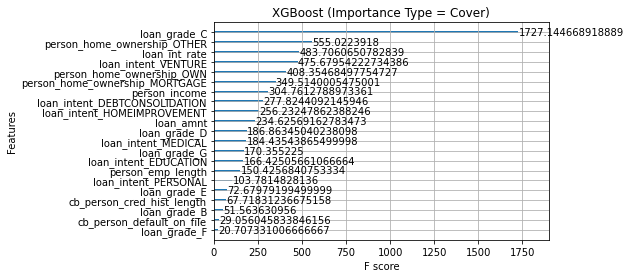

In [18]:
# XGBoost Feature Importance (Cover)
xgboost.plot_importance(tuned_xgboost_model, importance_type = 'cover')
plt.title('XGBoost (Importance Type = Cover)')
plt.show()

#### 2. Decision Tree

In [25]:
dt_model = DecisionTreeClassifier(random_state = 0)
dt_model.fit(x_train_smote, np.ravel(y_train_smote))

DecisionTreeClassifier(random_state=0)

In [33]:
# Cross Validation
score = cross_val_score(dt_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = dt_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = dt_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

89.14% accuracy with a standard deviation of 0.02
Training Accuracy: 100.00%, Testing Accuracy: 86.65%


In [34]:
parameters = [{'criterion': ['gini', 'entropy'], 
               'min_samples_leaf': range(1, 5), 
               'min_samples_split': range(2, 5), 
               'max_features': [None, 'sqrt', 'auto', 'log2']}]

grid_search = GridSearchCV(estimator = dt_model, param_grid = parameters, scoring = 'accuracy', n_jobs = -1)
best_model = grid_search.fit(x_train_smote, y_train_smote)
print('Optimum parameters', best_model.best_params_)

Optimum parameters {'criterion': 'entropy', 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2}


~1, train: 0.305, test: 0.224
~5, train: 0.165, test: 0.144
~10, train: 0.117, test: 0.100
~15, train: 0.069, test: 0.107
~20, train: 0.025, test: 0.127
~25, train: 0.004, test: 0.124
~30, train: 0.000, test: 0.127
~35, train: 0.000, test: 0.126
~40, train: 0.000, test: 0.126
~45, train: 0.000, test: 0.126
~50, train: 0.000, test: 0.126


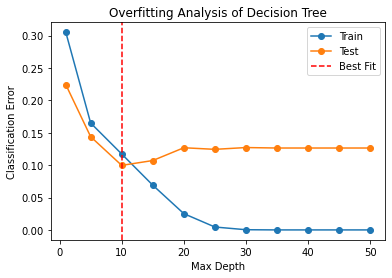

In [26]:
train_scores, test_scores = list(), list()
# define the tree depths to evaluate
values = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
# evaluate a Decision Tree for each depth
for i in values:
    # configure the model
    model = DecisionTreeClassifier(criterion = 'entropy', max_depth = i, max_features = None, min_samples_leaf = 1, min_samples_split = 2, random_state = 0)
    # fit model on the training dataset
    model.fit(x_train_smote, y_train_smote)
    # evaluate on the train dataset
    train_yhat = model.predict(x_train_smote)
    train_acc = 1 - accuracy_score(y_train_smote, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = 1 - accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('~%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
# plot of train and test scores vs tree depth
plt.plot(values, train_scores, '-o', label='Train')
plt.plot(values, test_scores, '-o', label='Test')
plt.axvline(10, color = 'red', linestyle = '--', label = 'Best Fit')
plt.xlabel("Max Depth")
plt.ylabel("Classification Error")
plt.title("Overfitting Analysis of Decision Tree")
plt.legend()
plt.show()

In [20]:
tuned_dt_model = DecisionTreeClassifier(criterion = 'entropy', 
                                        max_depth = 10, 
                                        max_features = None, 
                                        min_samples_leaf = 1, 
                                        min_samples_split = 2, 
                                        random_state = 0)
tuned_dt_model.fit(x_train_smote, np.ravel(y_train_smote))

DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=0)

In [22]:
# Accuracy of tuned Decision Tree model
score = cross_val_score(tuned_dt_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = tuned_dt_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = tuned_dt_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

86.67% accuracy with a standard deviation of 0.01
Training Accuracy: 88.28%, Testing Accuracy: 90.04%


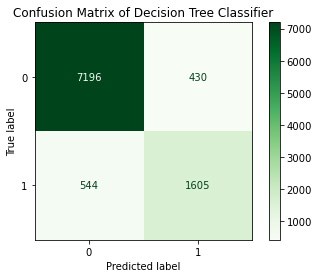

In [23]:
disp = ConfusionMatrixDisplay.from_estimator(tuned_dt_model, 
                                             x_test, 
                                             y_test, 
                                             cmap = plt.cm.Greens)
disp.ax_.set_title('Confusion Matrix of Decision Tree Classifier')
plt.show()

In [24]:
print(classification_report(y_test, test_ypred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.94      7626
           1       0.79      0.75      0.77      2149

    accuracy                           0.90      9775
   macro avg       0.86      0.85      0.85      9775
weighted avg       0.90      0.90      0.90      9775



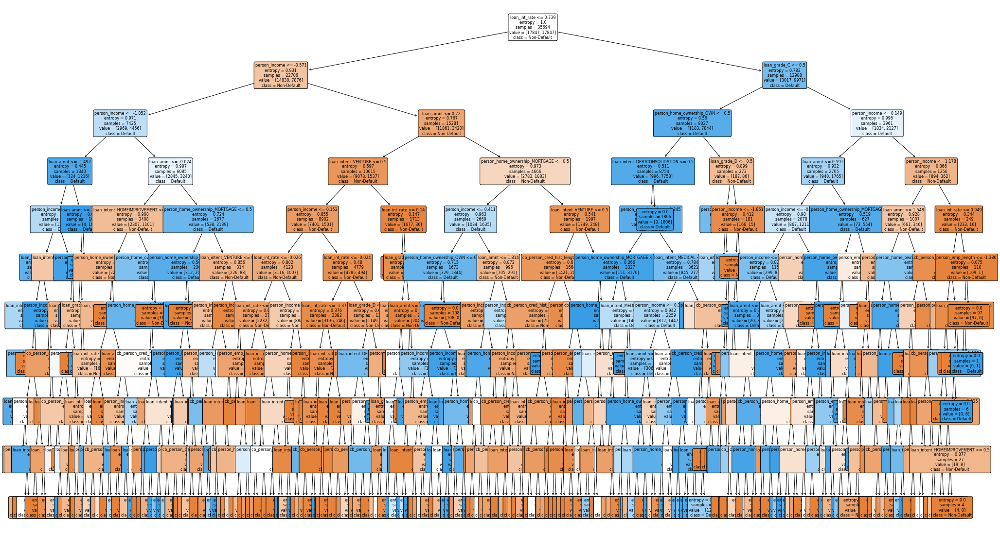

In [24]:
# Interpretability of Decision Tree
plt.figure(figsize = (35, 20))
tree.plot_tree(tuned_dt_model, 
              feature_names = x_train.columns.values,
              class_names = ['Non-Default', 'Default'],
              fontsize = 8,
              filled = True,
              rounded = True)
plt.savefig('Decision_Tree', dpi = 100)

#### 3. Support Vector Machine

In [42]:
svm_model = SVC(kernel = 'linear', random_state = 0)
svm_model.fit(x_train_smote, np.ravel(y_train_smote))

SVC(kernel='linear', random_state=0)

In [54]:
# Cross Validation
score = cross_val_score(svm_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = svm_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = svm_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

82.17% accuracy with a standard deviation of 0.01
Training Accuracy: 82.25%, Testing Accuracy: 81.41%


In [57]:
# Hyperparameters of SVM
parameters = [{'kernel': ['linear']},
             {'kernel': ['rbf', 'sigmoid', 'poly'], 'gamma': [0.001, 0.01, 0.1, 1]}]

# GridSearch CV of SVM model
grid_search = GridSearchCV(estimator = svm_model, param_grid = parameters, scoring = 'accuracy', n_jobs = -1)

best_model = grid_search.fit(x_train_smote, np.ravel(y_train_smote))
print('Optimum parameters', best_model.best_params_)

Optimum parameters {'gamma': 1, 'kernel': 'rbf'}


~0.050, train: 0.128, test: 0.150
~0.100, train: 0.108, test: 0.132
~0.200, train: 0.086, test: 0.123
~0.300, train: 0.074, test: 0.122
~0.400, train: 0.065, test: 0.122


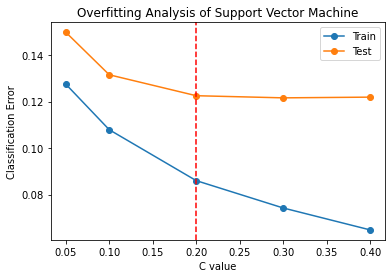

In [43]:
train_scores, test_scores = list(), list()
# C value
values = [0.05, 0.1, 0.2, 0.3, 0.4]
# evaluate a SVM model for each C value
for i in values:
    # configure the model
    model = SVC(C = i, kernel = 'rbf', gamma = 1, random_state = 0)
    # fit model on the training dataset
    model.fit(x_train_smote, np.ravel(y_train_smote))
    # evaluate on the train dataset
    train_yhat = model.predict(x_train_smote)
    train_acc = 1 - accuracy_score(y_train_smote, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = 1 - accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('~%.3f, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
# plot of train and test scores vs C values
plt.plot(values, train_scores, '-o', label='Train')
plt.plot(values, test_scores, '-o', label='Test')
plt.axvline(0.2, color = 'red', linestyle = '--')
plt.xlabel("C value")
plt.ylabel("Classification Error")
plt.title("Overfitting Analysis of Support Vector Machine")
plt.legend()
plt.show()

In [44]:
tuned_svm_model = SVC(C = 0.2, kernel = 'rbf', gamma = 1, random_state = 0)
tuned_svm_model.fit(x_train_smote, np.ravel(y_train_smote))

SVC(C=0.2, gamma=1, random_state=0)

In [45]:
# Accuracy of tuned Support Vector Machine model
score = cross_val_score(tuned_svm_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = tuned_svm_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = tuned_svm_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

88.42% accuracy with a standard deviation of 0.02
Training Accuracy: 91.40%, Testing Accuracy: 87.74%


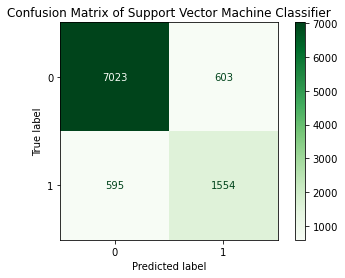

In [46]:
disp = ConfusionMatrixDisplay.from_estimator(tuned_svm_model, 
                                             x_test, 
                                             y_test, 
                                             cmap = plt.cm.Greens)
disp.ax_.set_title('Confusion Matrix of Support Vector Machine Classifier')
plt.show()

In [47]:
print(classification_report(y_test, test_ypred))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      7626
           1       0.72      0.72      0.72      2149

    accuracy                           0.88      9775
   macro avg       0.82      0.82      0.82      9775
weighted avg       0.88      0.88      0.88      9775



#### 4. Logistic Regresssion

In [14]:
lr_model = LogisticRegression(random_state = 0, max_iter = 350)
lr_model.fit(x_train_smote, np.ravel(y_train_smote))

LogisticRegression(max_iter=350, random_state=0)

In [29]:
# Cross Validation
score = cross_val_score(lr_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = lr_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = lr_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

81.67% accuracy with a standard deviation of 0.01
Training Accuracy: 81.69%, Testing Accuracy: 80.77%


In [18]:
# Hyperparameters of Logistic Regression
parameters = [{'penalty': ['l2'], 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 'tol': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]},
             {'penalty': ['l1'], 'solver': ['liblinear', 'saga'], 'tol': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]}]

# GridSearch CV of Logistic Regression model
grid_search = GridSearchCV(estimator = lr_model, param_grid = parameters, scoring = 'accuracy', n_jobs = -1)

best_model = grid_search.fit(x_train_smote, np.ravel(y_train_smote))
print('Optimum parameters', best_model.best_params_)

Optimum parameters {'penalty': 'l1', 'solver': 'saga', 'tol': 0.1}


~0.025, train: 0.191, test: 0.201
~0.050, train: 0.185, test: 0.191
~0.100, train: 0.183, test: 0.190
~0.200, train: 0.188, test: 0.201
~0.400, train: 0.187, test: 0.201
~0.800, train: 0.187, test: 0.200


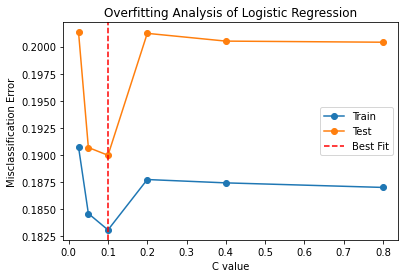

In [15]:
train_scores, test_scores = list(), list()
# C value
values = [0.025, 0.05, 0.1, 0.2, 0.4, 0.8]
# evaluate a Logistic Regression for each C value
for i in values:
    # configure the model
    model = LogisticRegression(penalty = 'l1', tol = 0.1 , C = i, solver = 'saga', random_state = 0, max_iter = 350)
    # fit model on the training dataset
    model.fit(x_train_smote, np.ravel(y_train_smote))
    # evaluate on the train dataset
    train_yhat = model.predict(x_train_smote)
    train_acc = 1 - accuracy_score(y_train_smote, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = 1 - accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('~%.3f, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
# plot of train and test scores vs C values
plt.plot(values, train_scores, '-o', label = 'Train')
plt.plot(values, test_scores, '-o', label = 'Test')
plt.axvline(0.1, color = 'red', linestyle = '--', label = 'Best Fit')
plt.xlabel("C value")
plt.ylabel("Misclassification Error")
plt.title("Overfitting Analysis of Logistic Regression")
plt.legend()
plt.show()

In [25]:
tuned_lr_model = LogisticRegression(penalty = 'l1', 
                                    solver = 'saga', 
                                    tol = 0.1, 
                                    C = 0.1, 
                                    random_state = 0, 
                                    max_iter = 350)
tuned_lr_model.fit(x_train_smote, np.ravel(y_train_smote))

LogisticRegression(C=0.1, max_iter=350, penalty='l1', random_state=0,
                   solver='saga', tol=0.1)

In [17]:
# Accuracy of tuned Logistic Regression model
score = cross_val_score(tuned_lr_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = tuned_lr_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = tuned_lr_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

81.52% accuracy with a standard deviation of 0.01
Training Accuracy: 81.69%, Testing Accuracy: 81.00%


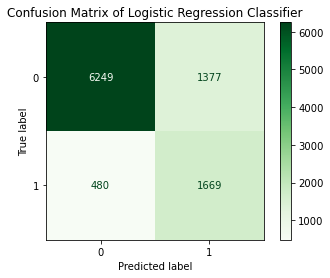

In [18]:
disp = ConfusionMatrixDisplay.from_estimator(tuned_lr_model, 
                                             x_test, 
                                             y_test, 
                                             cmap = plt.cm.Greens)
disp.ax_.set_title('Confusion Matrix of Logistic Regression Classifier')
plt.show()

In [53]:
print(classification_report(y_test, test_ypred))

              precision    recall  f1-score   support

           0       0.93      0.82      0.87      7626
           1       0.55      0.78      0.64      2149

    accuracy                           0.81      9775
   macro avg       0.74      0.80      0.76      9775
weighted avg       0.84      0.81      0.82      9775



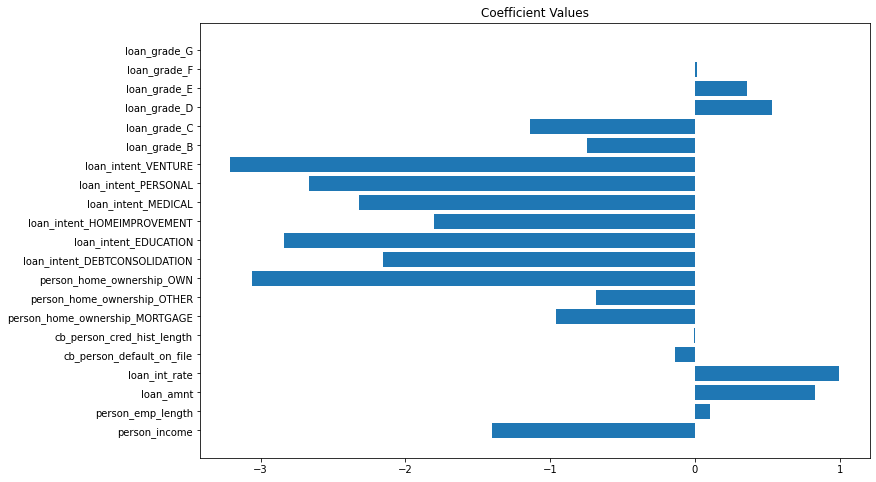

In [26]:
# Interpretability of Logistic Regression
plt.figure(figsize = (12, 8))
plt.barh(x_train.columns, tuned_lr_model.coef_[0])
plt.title('Coefficient Values')
plt.show()

#### 5. Artificial Neural Network

In [16]:
tf.random.set_seed(1) # Set random seed
def build_ann():
    # Creating the layers of the Neural Network
    ann = tf.keras.models.Sequential()
    ann.add(tf.keras.layers.Dense(units = 21, activation = 'relu'))
    ann.add(tf.keras.layers.Dense(units = 21, activation = 'relu'))
    ann.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))
    ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
    return ann

# Create an object of the KerasClassifier class
ann_model = KerasClassifier(build_fn = build_ann)

# Fit the training data to the Neural Network
ann_model.fit(x_train_smote, y_train_smote)

1116/1116 [==============================] - 3s 2ms/step - loss: 0.4195 - accuracy: 0.8097


In [17]:
# Cross Validation
score = cross_val_score(ann_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = ann_model.predict(x_train_smote)
predictions = [np.round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = ann_model.predict(x_test)
predictions = [np.round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean() * 100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy * 100))

82.96% accuracy with a standard deviation of 0.01
Training Accuracy: 84.36%, Testing Accuracy: 85.84%


In [18]:
def hyperparam_ann(optimizer, unit1, unit2):
    # Creating the layers of the Neural Network
    ann = tf.keras.models.Sequential()
    ann.add(tf.keras.layers.Dense(units = unit1, activation = 'relu'))
    ann.add(tf.keras.layers.Dense(units = unit2, activation = 'relu'))
    ann.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))
    ann.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])
    return ann

ann_model = KerasClassifier(build_fn = hyperparam_ann, verbose = 0)

# Hyperparameters of Neural Network model
parameters = [{'batch_size': [8, 16, 32, 64], 'optimizer': ['adam', 'rmsprop', 'SGD'], 'unit1': [10, 15, 20, 25, 30, 35], 'unit2': [10, 15, 20, 25, 30, 35]}]

# GridSearch CV of Neural Network model
grid_search = GridSearchCV(estimator = ann_model, param_grid = parameters, scoring = 'accuracy', n_jobs = -1)

best_model = grid_search.fit(x_train_smote, np.ravel(y_train_smote))
print('Optimum parameters', best_model.best_params_)

Optimum parameters {'batch_size': 8, 'optimizer': 'adam', 'unit1': 35, 'unit2': 25}


~1, train: 0.146, test: 0.126
~5, train: 0.132, test: 0.120
~10, train: 0.120, test: 0.099
~25, train: 0.106, test: 0.102
~50, train: 0.095, test: 0.119
~100, train: 0.089, test: 0.117


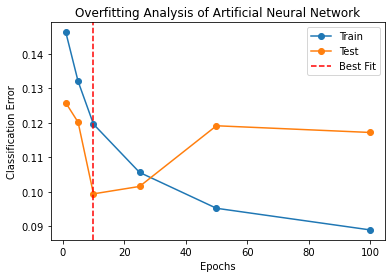

In [61]:
train_scores, test_scores = list(), list()
# epochs value
values = [1, 5, 10, 25, 50, 100]
# evaluate a Logistic Regression for each C value
for i in values:
    tf.random.set_seed(1)
    # Neural Network new hyperparameters
    ann_model = hyperparam_ann('adam', 35, 25)
    # configure and fit the model on the training dataset
    ann_model.fit(x_train_smote, y_train_smote, batch_size = 8, epochs = i, verbose = 0)
    # evaluate on the train dataset
    train_yhat = ann_model.predict(x_train_smote)
    train_yhat = [np.round(value) for value in train_yhat]
    train_acc = 1 - accuracy_score(y_train_smote, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = ann_model.predict(x_test)
    test_yhat = [np.round(value) for value in test_yhat]
    test_acc = 1 - accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('~%.0f, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
# plot of train and test scores vs C values
plt.plot(values, train_scores, '-o', label='Train')
plt.plot(values, test_scores, '-o', label='Test')
plt.axvline(10, color = 'red', linestyle = '--', label = 'Best Fit')
plt.xlabel("Epochs")
plt.ylabel("Classification Error")
plt.title("Overfitting Analysis of Artificial Neural Network")
plt.legend()
plt.show()

In [55]:
tf.random.set_seed(1)
def tuned_ann():
    # Creating the layers of the Neural Network
    ann = tf.keras.models.Sequential()
    ann.add(tf.keras.layers.Dense(units = 35, activation = 'relu'))
    ann.add(tf.keras.layers.Dense(units = 25, activation = 'relu'))
    ann.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))
    ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
    return ann

# Create an object of the KerasClassifier class
tuned_ann_model = KerasClassifier(build_fn = tuned_ann)

# Fit the training data to the Neural Network
tuned_ann_model.fit(x_train_smote, y_train_smote, batch_size = 8, epochs = 10)

Epoch 1/10
4462/4462 [==============================] - 3s 559us/step - loss: 0.3737 - accuracy: 0.8341
Epoch 2/10
4462/4462 [==============================] - 2s 554us/step - loss: 0.3187 - accuracy: 0.8580
Epoch 3/10
4462/4462 [==============================] - 2s 556us/step - loss: 0.3053 - accuracy: 0.8609
Epoch 4/10
4462/4462 [==============================] - 2s 552us/step - loss: 0.2951 - accuracy: 0.8655
Epoch 5/10
4462/4462 [==============================] - 2s 554us/step - loss: 0.2886 - accuracy: 0.8679
Epoch 6/10
4462/4462 [==============================] - 3s 572us/step - loss: 0.2830 - accuracy: 0.8721
Epoch 7/10
4462/4462 [==============================] - 2s 553us/step - loss: 0.2792 - accuracy: 0.8728
Epoch 8/10
4462/4462 [==============================] - 2s 551us/step - loss: 0.2756 - accuracy: 0.8744
Epoch 9/10
4462/4462 [==============================] - 3s 571us/step - loss: 0.2717 - accuracy: 0.8767
Epoch 10/10
4462/4462 [==============================] - 2s 552u

In [56]:
# Accuracy of tuned Neural Network model
score = cross_val_score(tuned_ann_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = tuned_ann_model.predict(x_train_smote)
predictions = [np.round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = tuned_ann_model.predict(x_test)
predictions = [np.round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean() * 100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy * 100))

83.56% accuracy with a standard deviation of 0.02
Training Accuracy: 88.03%, Testing Accuracy: 90.06%


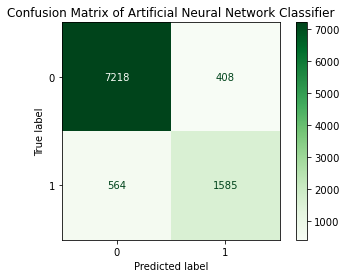

In [57]:
tuned_ann_model._estimator_type = "classifier"
disp = ConfusionMatrixDisplay.from_estimator(tuned_ann_model, 
                                             x_test, 
                                             y_test, 
                                             cmap = plt.cm.Greens)
disp.ax_.set_title('Confusion Matrix of Artificial Neural Network Classifier')
plt.show()

In [59]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      7626
           1       0.80      0.74      0.77      2149

    accuracy                           0.90      9775
   macro avg       0.86      0.84      0.85      9775
weighted avg       0.90      0.90      0.90      9775



### Voting Ensemble

In [71]:
estimator = []
estimator.append(('SVM', SVC(C = 0.2, 
                             kernel = 'rbf', 
                             gamma = 1, 
                             random_state = 0, 
                             probability = True)))

estimator.append(('LR', LogisticRegression(penalty = 'l1', 
                                           solver = 'saga', 
                                           tol = 0.1, 
                                           C = 0.1, 
                                           random_state = 0, 
                                           max_iter = 350)))

estimator.append(('DT', DecisionTreeClassifier(criterion = 'entropy', 
                                               max_depth = 10, 
                                               max_features = None, 
                                               min_samples_leaf = 1, 
                                               min_samples_split = 2, 
                                               random_state = 0)))

ve_model = VotingClassifier(estimators = estimator, voting = 'soft')
ve_model.fit(x_train_smote, np.ravel(y_train_smote))

VotingClassifier(estimators=[('SVM',
                              SVC(C=0.2, gamma=1, probability=True,
                                  random_state=0)),
                             ('LR',
                              LogisticRegression(C=0.1, max_iter=350,
                                                 penalty='l1', random_state=0,
                                                 solver='saga', tol=0.1)),
                             ('DT',
                              DecisionTreeClassifier(criterion='entropy',
                                                     max_depth=10,
                                                     random_state=0))],
                 voting='soft')

In [72]:
# Accuracy of Voting Classifier model
score = cross_val_score(ve_model, x_train_smote, y_train_smote, scoring = 'accuracy', cv = 10, n_jobs = -1)

# Training Set Evaluation 
train_ypred = ve_model.predict(x_train_smote)
predictions = [round(value) for value in train_ypred]
train_accuracy = accuracy_score(y_train_smote, predictions) # evaluate predictions

# Testing Set Evaluation 
test_ypred = ve_model.predict(x_test)
predictions = [round(value) for value in test_ypred]
test_accuracy = accuracy_score(y_test, predictions) # evaluate predictions

print("%0.2f%% accuracy with a standard deviation of %0.2f" % (score.mean()*100, score.std()))
print("Training Accuracy: %.2f%%, Testing Accuracy: %.2f%%" % (train_accuracy * 100, test_accuracy*100))

87.99% accuracy with a standard deviation of 0.01
Training Accuracy: 90.08%, Testing Accuracy: 88.54%


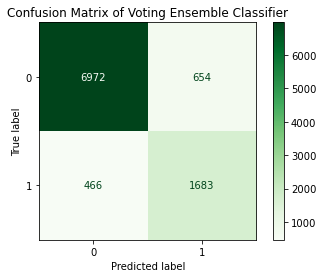

In [73]:
disp = ConfusionMatrixDisplay.from_estimator(ve_model, 
                                             x_test, 
                                             y_test, 
                                             cmap = plt.cm.Greens)
disp.ax_.set_title('Confusion Matrix of Voting Ensemble Classifier')
plt.show()

In [74]:
print(classification_report(y_test, test_ypred))

              precision    recall  f1-score   support

           0       0.94      0.91      0.93      7626
           1       0.72      0.78      0.75      2149

    accuracy                           0.89      9775
   macro avg       0.83      0.85      0.84      9775
weighted avg       0.89      0.89      0.89      9775



--------------

## 6.0 Results and Discussion
### ROC Curve and AUC Measures

In [19]:
# Storing all the classifiers
classifiers = [XGBClassifier(gamma = 1, 
                             learning_rate = 0.1, 
                             max_depth = 9, 
                             reg_lambda = 1, 
                             n_estimators = 10, 
                             use_label_encoder = False, 
                             eval_metric='logloss'),
               DecisionTreeClassifier(criterion = 'entropy', 
                                      max_depth = 10, 
                                      max_features = None, 
                                      min_samples_leaf = 1, 
                                      min_samples_split = 2, 
                                      random_state = 0),
              SVC(C = 0.2, kernel = 'rbf', gamma = 1, random_state = 0, probability = True),
              LogisticRegression(penalty = 'l1', 
                                 solver = 'saga', 
                                 tol = 0.1, 
                                 C = 0.1, 
                                 random_state = 0, 
                                 max_iter = 350),
              VotingClassifier(estimators = estimator, voting = 'soft')]

# Define a result table as a DataFrame
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])

# Train the models and record the results
for cls in classifiers:
    model = cls.fit(x_train_smote, np.ravel(y_train_smote))
    y_pred = model.predict_proba(x_test)[:,1]
    
    # Calculate the scores and ROC Curve
    fpr, tpr, threshold = roc_curve(y_test,  y_pred)
    auc = roc_auc_score(y_test, y_pred)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)

# ROC Curve for Artificial Neural Network
# Create an object of the KerasClassifier class
tuned_ann_model = KerasClassifier(build_fn = tuned_ann)

# Fit the training data to the Neural Network
tuned_ann_model.fit(x_train_smote, y_train_smote, batch_size = 8, epochs = 10, verbose = 0)
y_pred = tuned_ann_model.predict(x_test).ravel()

# Calculate the scores and ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)

result_table = result_table.append({'classifiers':'ArtificialNeuralNetwork',
                                    'fpr':fpr, 
                                    'tpr':tpr, 
                                    'auc':auc}, ignore_index=True)

# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

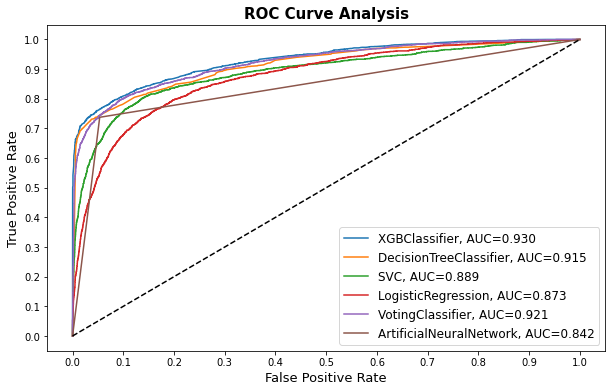

In [20]:
fig = plt.figure(figsize=(10,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='black', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize = 13)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize = 13)

plt.title('ROC Curve Analysis', fontweight = 'bold', fontsize = 15)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

-----------

### Store Python Object in Pickle - For Building Web App

In [16]:
pk = {'model': tuned_xgboost_model, 
      'label_encoder': label_encoder, 
      'pt_yeo_johnson': pt_yeo_johnson, 
      'x_train_smote': x_train_smote}
with open('D:\Essien\Degree Studies\Degree Level 3\Semester 2\FYP\WebApp\steps.pkl', 'wb') as file:
    pickle.dump(pk, file)

-------------------